# Анализ полученных кластеров

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from pathlib import Path

In [2]:
clusters = pd.read_parquet('results/clusters_dino_v2.pq')

In [3]:
image_data = pd.read_parquet('embeddings&markup/image_markup_test.pq')

In [4]:
image_data.head(3)

,cluster_id,n_samples,name,image_path
0,1136,1,P8120624.JPG,/cv-sandbox/project_CV-2025-07/data/P8120624.JPG
1,1035,2,IMG_20220626_112422.jpg,/cv-sandbox/project_CV-2025-07/data/IMG_202206...
2,1035,2,IMG_20220626_112418.jpg,/cv-sandbox/project_CV-2025-07/data/IMG_202206...


In [5]:
clusters.head(3)

,name,cluster_id
0,IMG_20220520_095823.jpg,0
1,IMG_20220520_095833.jpg,0
2,IMG_20220520_095835.jpg,0


In [6]:
n_clusters_samples = clusters.groupby('cluster_id')['name'].nunique().reset_index().rename({'name': 'n_cluster_samples'}, axis=1)

In [7]:
clusters = clusters.merge(n_clusters_samples, on='cluster_id')

In [8]:
clusters.head()

,name,cluster_id,n_cluster_samples
0,IMG_20220520_095823.jpg,0,3
1,IMG_20220520_095833.jpg,0,3
2,IMG_20220520_095835.jpg,0,3
3,IMG_20230528_203735.jpg,1,2
4,IMG_20230528_203741.jpg,1,2


**Объединим данные по кластерам и по исходным группам**

In [9]:
common_data = image_data.rename({'cluster_id': 'group_id',
                                 'n_samples': 'n_group_samples'},
                                axis=1).merge(clusters, on='name', how='left')

In [10]:
common_data.head()

,group_id,n_group_samples,name,image_path,cluster_id,n_cluster_samples
0,1136,1,P8120624.JPG,/cv-sandbox/project_CV-2025-07/data/P8120624.JPG,NaN,NaN
1,1035,2,IMG_20220626_112422.jpg,/cv-sandbox/project_CV-2025-07/data/IMG_202206...,NaN,NaN
2,1035,2,IMG_20220626_112418.jpg,/cv-sandbox/project_CV-2025-07/data/IMG_202206...,NaN,NaN
3,1008,1,IMG_20220419_140144.jpg,/cv-sandbox/project_CV-2025-07/data/IMG_202204...,NaN,NaN
4,1068,1,IMG_20221025_134321.jpg,/cv-sandbox/project_CV-2025-07/data/IMG_202210...,NaN,NaN


In [11]:
common_data.loc[common_data['n_cluster_samples'].isna(), 'n_cluster_samples'] = 1

In [12]:
start = int(common_data['cluster_id'].max() + 1)
N = int(common_data['cluster_id'].isna().sum())

In [13]:
start

47

In [14]:
N

71

In [15]:
common_data.loc[common_data['cluster_id'].isna(), 'cluster_id'] = list(1000 + i for i in range(start, start + N))

In [20]:
common_data['cluster_id'] = common_data['cluster_id'].astype('int32')
common_data['n_cluster_samples'] = common_data['n_cluster_samples'].astype('int32')

In [21]:
common_data.isna().sum()

group_id             0
n_group_samples      0
name                 0
image_path           0
cluster_id           0
n_cluster_samples    0
dtype: int64

In [22]:
common_data.head()

,group_id,n_group_samples,name,image_path,cluster_id,n_cluster_samples
0,1136,1,P8120624.JPG,/cv-sandbox/project_CV-2025-07/data/P8120624.JPG,1047,1
1,1035,2,IMG_20220626_112422.jpg,/cv-sandbox/project_CV-2025-07/data/IMG_202206...,1048,1
2,1035,2,IMG_20220626_112418.jpg,/cv-sandbox/project_CV-2025-07/data/IMG_202206...,1049,1
3,1008,1,IMG_20220419_140144.jpg,/cv-sandbox/project_CV-2025-07/data/IMG_202204...,1050,1
4,1068,1,IMG_20221025_134321.jpg,/cv-sandbox/project_CV-2025-07/data/IMG_202210...,1051,1


## Посмотрим, как соотносятся группы и кластеры

**Количество групп на кластер; кластеры, в которые попали фото из наибольшего количества групп**

In [39]:
gr_vs_clusters = common_data.groupby('cluster_id')['group_id'].nunique().reset_index().rename({'group_id': 'n_groups'}, axis=1).sort_values('n_groups', ascending=False)

In [33]:
common_data['n_cluster_samples'].value_counts()

1     71
2     60
3     42
12    12
10    10
6      6
Name: n_cluster_samples, dtype: int64

In [42]:
gr_vs_clusters.head(10)

,cluster_id,n_groups
4,4,7
7,7,6
3,3,5
0,0,2
9,9,2
14,14,2
13,13,2
1,1,2
10,10,2
33,33,2


In [41]:
gr_vs_clusters['n_groups'].value_counts()

1    106
2      9
7      1
6      1
5      1
Name: n_groups, dtype: int64

То есть, существуют кластеры, объединяющие в себе 5 - 7 групп, девять кластеров по 2 группы; в основном - один кластер - одна группа

**Количество кластеров на группу; группы, которые разбились сильнее всего**

In [35]:
cl_vs_groups = common_data.groupby('group_id')['cluster_id'].nunique().reset_index().rename({'cluster_id': 'n_clusters'}, axis=1).sort_values('n_clusters', ascending=False)

In [36]:
common_data['n_group_samples'].value_counts()

2    88
1    80
3    33
Name: n_group_samples, dtype: int64

In [37]:
cl_vs_groups.head()

,group_id,n_clusters
13,23,2
2,4,2
68,1035,2
74,1043,2
31,47,2


In [38]:
cl_vs_groups['n_clusters'].value_counts()

1    128
2      7
Name: n_clusters, dtype: int64

То есть, максимум, группа разбивается на два кластера (таких случаев 7)

### Кластеры, в которые входят несколько групп

In [50]:
def get_samples(cl_id, cluster_col='cluster_id', ncols=3):
    paths = common_data.loc[common_data[cluster_col] == cl_id, 'image_path'].values
    nrows = int(np.ceil(len(paths) / ncols))
    fig, ax = plt.subplots(figsize=(16, 4 * nrows), nrows=nrows, ncols=ncols)
    plt.subplots_adjust(hspace=0.2 + 0.05 * nrows)
    for i, p in enumerate(paths):
        mask = common_data['image_path'] == p
        image_name = p.split('/')[-1]
        group_col = list({'cluster_id', 'group_id'} - {cluster_col})[0]
        group_id = common_data.loc[mask, group_col].values[0]
        title = f"Photo {image_name},\n {group_col} #{group_id}, {cluster_col} #{cl_id}"
        if nrows == 1:
            ax[i].set_title(title)
            ax[i].imshow(Image.open(p).convert('RGB'))
        else:
            ax[i // ncols, i - ncols * (i // ncols)].set_title(title)
            ax[i // ncols, i - ncols * (i // ncols)].imshow(Image.open(p).convert('RGB'))

Кластер 4

Кластер 4

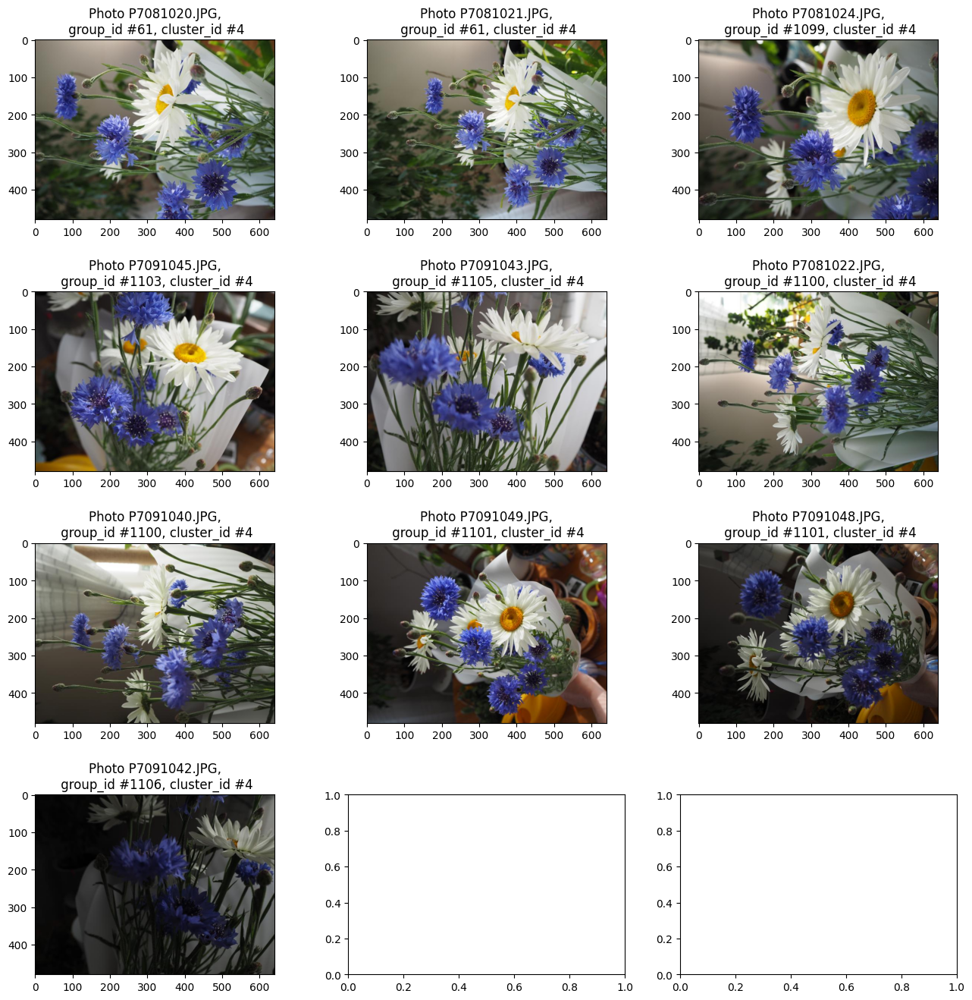

In [53]:
get_samples(4)

Кластер 7

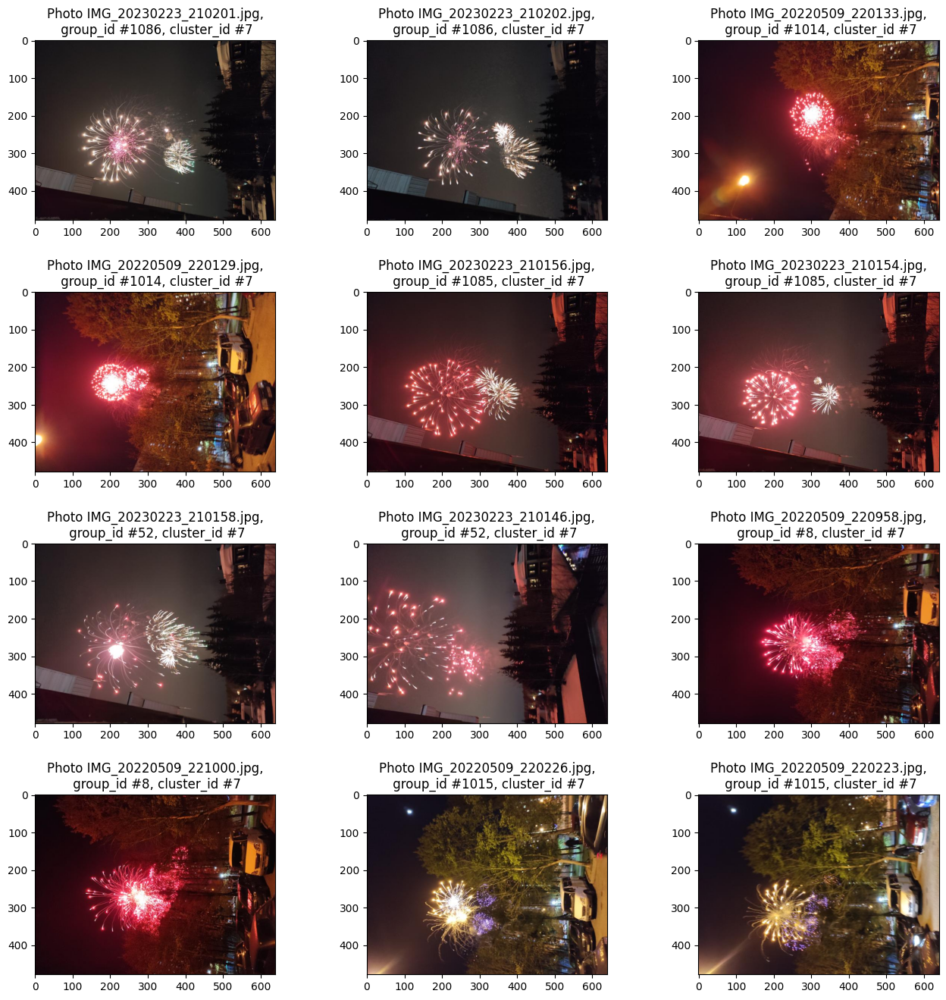

In [51]:
get_samples(7)

Кластер 3

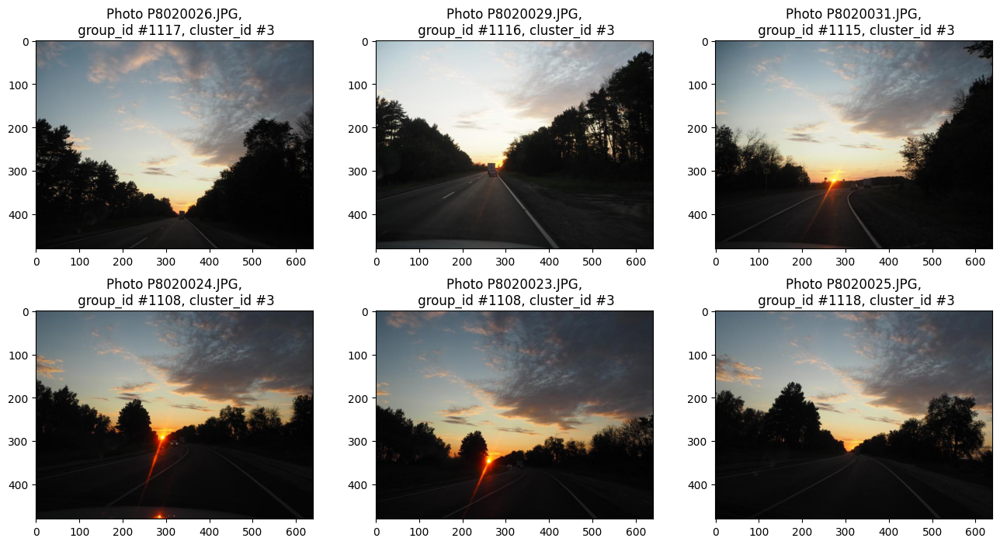

In [52]:
get_samples(3)

Кластер 0

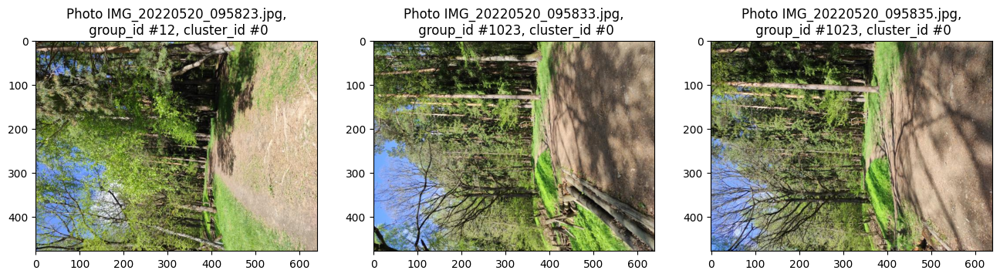

In [54]:
get_samples(0)

Кластер 1

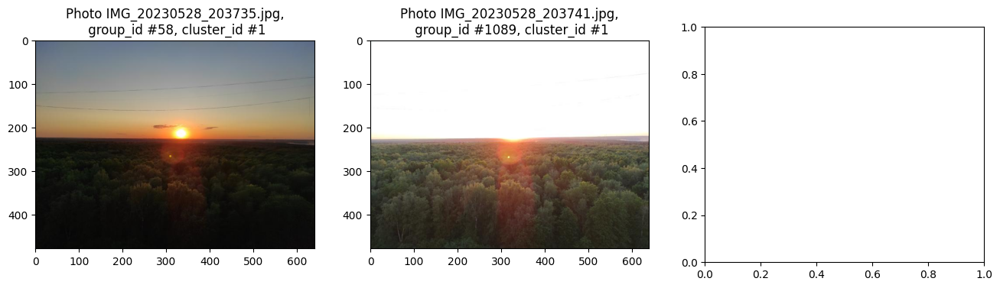

In [55]:
get_samples(1)

### Группы, которые разбились на несколько кластеров

In [56]:
cl_vs_groups.head(10)

,group_id,n_clusters
13,23,2
2,4,2
68,1035,2
74,1043,2
31,47,2
56,1017,2
60,1022,2
0,0,1
89,1067,1
90,1068,1


Группа 23

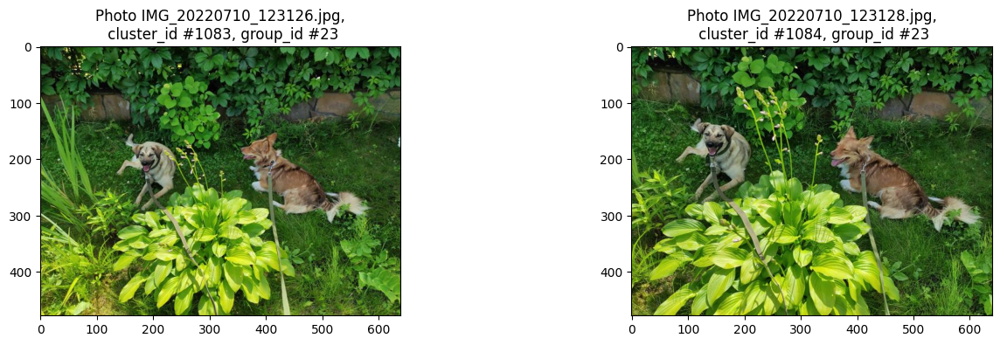

In [57]:
get_samples(23, cluster_col='group_id', ncols=2)

Группа 4

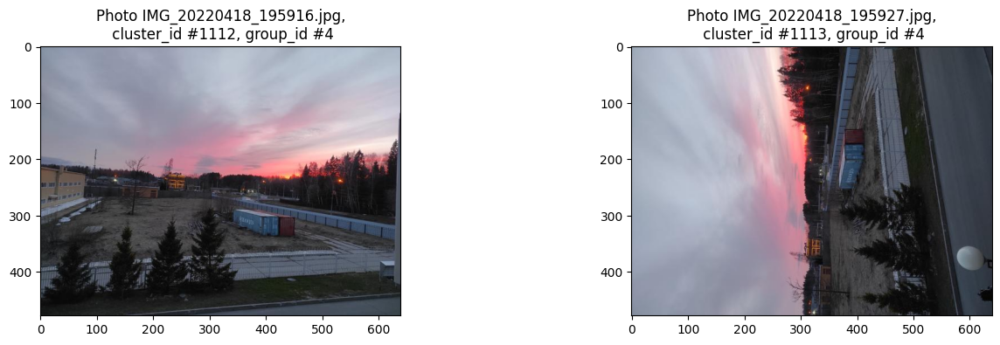

In [58]:
get_samples(4, cluster_col='group_id', ncols=2)

Группа 1035

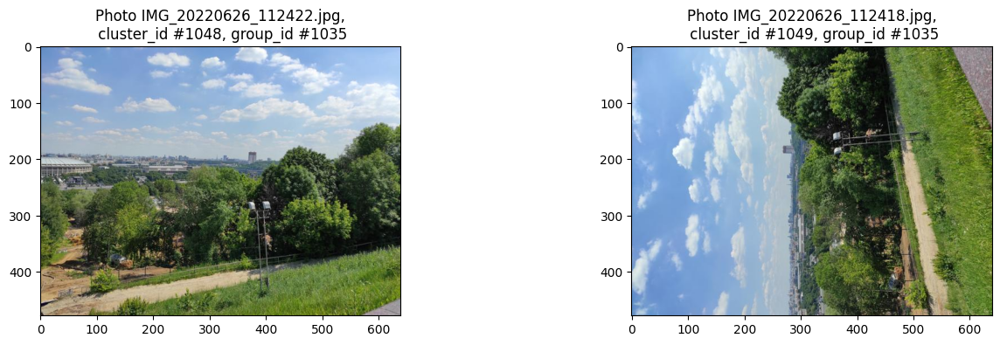

In [59]:
get_samples(1035, cluster_col='group_id', ncols=2)

Группа 1043

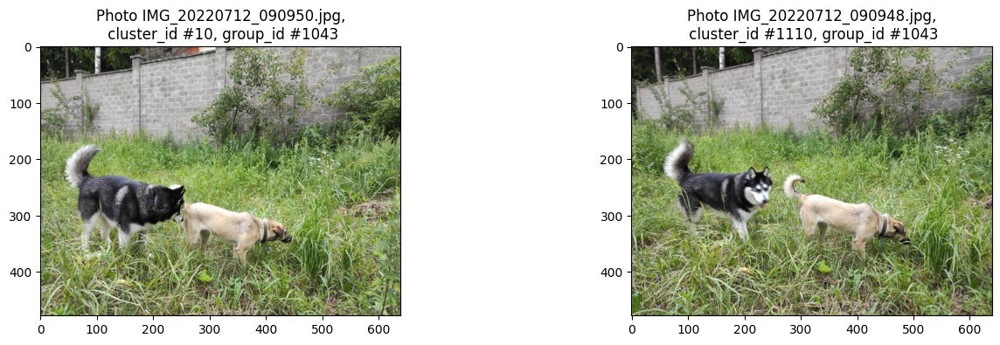

In [60]:
get_samples(1043, cluster_col='group_id', ncols=2)

Группа 47

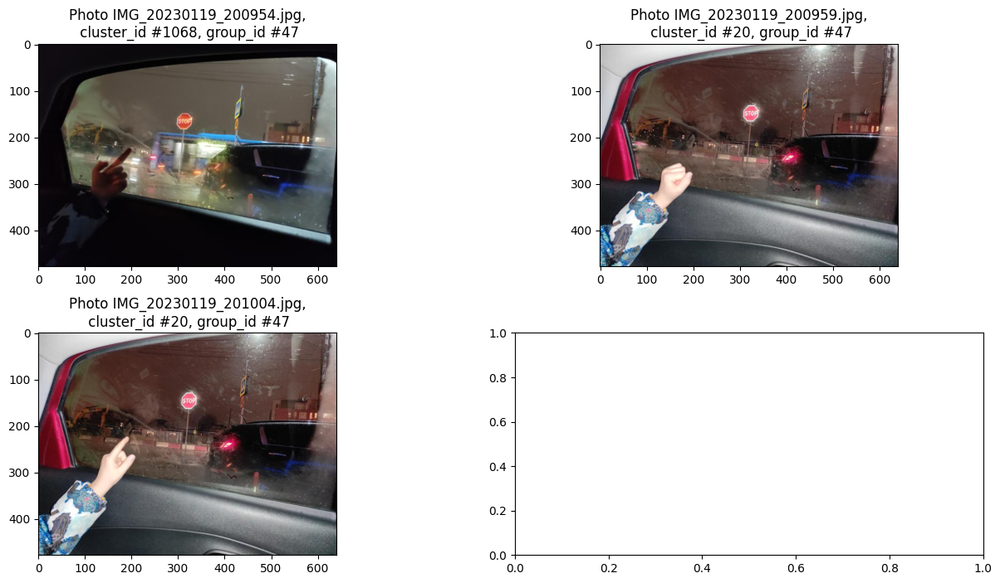

In [61]:
get_samples(47, cluster_col='group_id', ncols=2)

Группа 1017

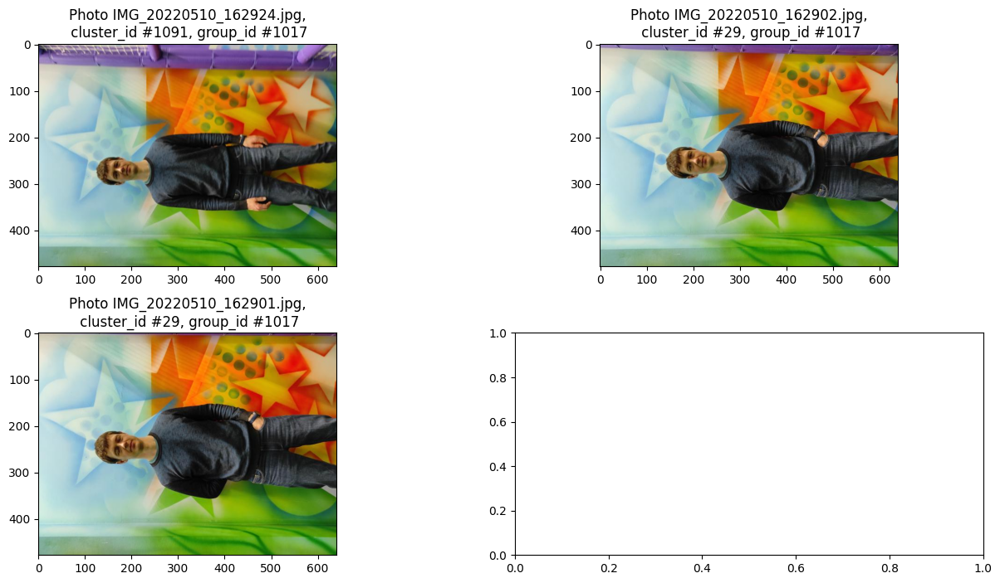

In [62]:
get_samples(1017, cluster_col='group_id', ncols=2)

Группа 1022

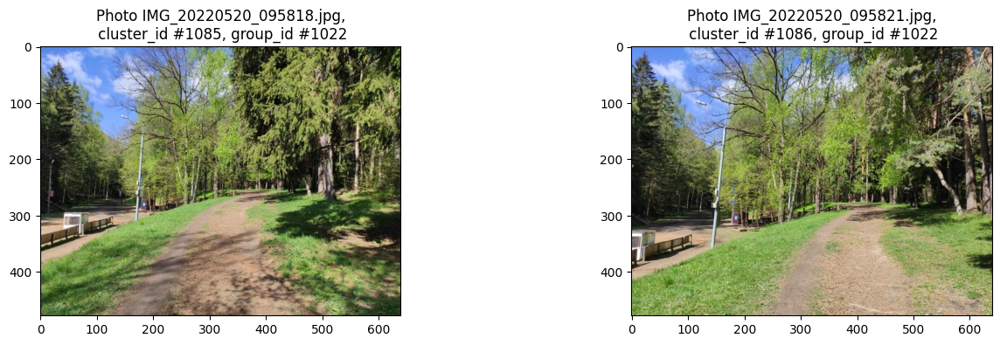

In [63]:
get_samples(1022, cluster_col='group_id', ncols=2)